# Yelp Data

In [45]:
from __future__ import print_function

import argparse
import geopandas as gpd
import json
import numpy as np
import math
from math import pi
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import os
import pandas as pd
import pprint
import pylab as pl
import requests
from scipy.cluster.hierarchy import linkage, dendrogram, set_link_color_palette
import seaborn as sns
from sklearn import preprocessing
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
import shutil 
import sys
import urllib
import urllib.request 
import zipfile
%matplotlib inline

try:
    # For Python 3.0 and later
    from urllib.error import HTTPError
    from urllib.parse import quote
    from urllib.parse import urlencode
except ImportError:
    # Fall back to Python 2's urllib2 and urllib
    from urllib2 import HTTPError
    from urllib import quote
    from urllib import urlencode
    
from pandas.io.json import json_normalize
from shapely.geometry import Point

In [2]:
# Constants for accessing the API
API_KEY = open('yelp_api.txt', 'r').readlines()[1][:-1] # api stored in seperate .txt file
API_HOST = 'https://api.yelp.com'
SEARCH_PATH = '/v3/businesses/search'
BUSINESS_PATH = '/v3/businesses/'

### Search Terms
params = {
    'term': 'coffee',
    'location': 'Clinton Hill, Brooklyn',
    'limit':'50'
}

In [3]:
def request(host=API_HOST, path=SEARCH_PATH, api_key=API_KEY, url_params=params):
    """Given your API_KEY, send a GET request to the API.
    Args:
        host (str): The domain host of the API.
        path (str): The path of the API after the domain.
        API_KEY (str): Your API Key.
        url_params (dict): An optional set of query parameters in the request.
    Returns:
        dict: The JSON response from the request.
    Raises:
        HTTPError: An error occurs from the HTTP request.
    """
    url_params = url_params or {}
    url = '{0}{1}'.format(host, quote(path.encode('utf8')))
    headers = {
        'Authorization': 'Bearer %s' % api_key,
    }

    response = requests.request('GET', url, headers=headers, params=url_params)

    return response.json()

In [4]:
def search(api_key, term, location, categories, offset, price):
    """Query the Search API by a search term and location.
    Args:
        term (str): The search term passed to the API.
        location (str): The search location passed to the API.
    Returns:
        dict: The JSON response from the request.
    """

    url_params = {
        'term': term.replace(' ', '+'),
        'location': location.replace(' ', '+'),
        'limit': int(params['limit']),
        'offset': offset,
        'categories': categories,
        'price':price
    }
    
    find_locs = request(API_HOST, SEARCH_PATH, api_key, url_params=url_params)
    try:
        return json_normalize(find_locs['businesses'])
    except AttributeError:
        return find_locs

In [5]:
# don't really need this, but useful for initially analyzing the pulls from yelp
def print_pretty_yelp_json(json):
    for i in range(len(json['businesses'])):
        item = json['businesses'][i] #['alias']

        print(' Store Name:',item['name'], '\n',
              'Categories:', [item['categories'][i]['title'] \
                              for i in range(len(item['categories']))], '\n',
              'Latitude:', item['coordinates']['latitude'], '\n',
              'Longitude:', item['coordinates']['longitude'], '\n',
              'City:', item['location']['city'], '\n',
              'Zip Code:', item['location']['zip_code'], '\n',
              'Price:', item['price'],  '\n',
              'Rating:', item['rating'], '\n',
              'Review Count:', item['review_count'], '\n')

In [6]:
def filtered_coffee(df):
    '''
    Returns dataframe with only necessary columns, and cleaned in such a way as we will need them later.
    '''
    category_list = [[df['categories'][j][i]['title'] \
    for i in range(len(df['categories'][j]))] \
    for j in range(len(df['categories']))]

    location = list(zip(df['coordinates.latitude'], 
                             df['coordinates.longitude']))

    columns = ['Store_Name', 'Categories', 'Location', 'City', 
                   'Zip_Code', 'Price', 'Rating', 'Review_Count']
    data = [list(df['name']), category_list, location, list(df['location.city']),
                list(df['location.zip_code']), list(df['price']), list(df['rating']), 
                list(df['review_count'])]


    filtered_coffee = pd.DataFrame(data = dict(zip(columns, data)))
    filtered_coffee = filtered_coffee[columns]
    return filtered_coffee

In [7]:
def find_coffee(search_term='coffee', loc='Brooklyn',category=None, loops=20, price=[1,2,3,4]):
    
    '''
    The main workhorse here, this pulls all of the coffee shops from yelp, doing many exhausting cycles.
    '''
    
    coffee_shops_df = None
    print(loc)
    
    for neighborhood in neighborhoods[neighborhoods.City==loc].search_term:
        print(neighborhood)
        
        for i in range(loops):
            
            try:
                # max api allows is 50 per pull
                coffee_results = search(API_KEY, search_term, neighborhood, category, i*50, price)
            except IndexError:
                # error raised once no more coffee shops in the area are found.
                # this loop allows to capture the largest remaining no. of coffee shops
                for j in range(49, -1, -1): 
                    if j == 0:
                        break
                    try:
                        coffee_results = search(API_KEY, search_term, neighborhood, category, i*j, price)
                    except IndexError:
                        continue
                    break

            try:
                coffee_results = filtered_coffee(coffee_results)

                if isinstance(coffee_shops_df, pd.DataFrame):
                    coffee_shops_df = pd.concat([coffee_shops_df, coffee_results])
                    coffee_shops_df.reset_index(drop=True, inplace=True)
                else:
                    coffee_shops_df = coffee_results
            except KeyError:
                break
        
    coffee_shops_df = coffee_shops_df.drop_duplicates('Location')
    coffee_shops_df = coffee_shops_df[coffee_shops_df['Review_Count'] > 5]
    coffee_shops_df = coffee_shops_df[coffee_shops_df['Categories'].apply(lambda x:('Coffee & Tea' or 'Coffee Roasteries' or 'Cafes') in x)]
            
    return coffee_shops_df.reset_index(drop=True)


### USED TO GET NEIGHBORHOOD NAMES FOR NEW CITIES
# def find_coffee(search_term='coffee', loc='Brooklyn',category=None, loops=20, price=[1,2,3,4]):
    
#     '''
#     The main workhorse here, this pulls all of the coffee shops from yelp, doing many exhausting cycles.
#     '''
    
#     coffee_shops_df = None
#     print(loc)
        
#     for i in range(loops):

#         try:
#             # max api allows is 50 per pull
#             coffee_results = search(API_KEY, search_term, loc, category, i*50, price)
#         except IndexError:
#             # error raised once no more coffee shops in the area are found.
#             # this loop allows to capture the largest remaining no. of coffee shops
#             for j in range(49, -1, -1): 
#                 if j == 0:
#                     break
#                 try:
#                     coffee_results = search(API_KEY, search_term, loc, category, i*j, price)
#                 except IndexError:
#                     continue
#                 break

#         try:
#             coffee_results = filtered_coffee(coffee_results)

#             if isinstance(coffee_shops_df, pd.DataFrame):
#                 coffee_shops_df = pd.concat([coffee_shops_df, coffee_results])
#                 coffee_shops_df.reset_index(drop=True, inplace=True)
#             else:
#                 coffee_shops_df = coffee_results
#         except KeyError:
#             break
        
# #     coffee_shops_df = coffee_shops_df.drop_duplicates('Location')
# #     coffee_shops_df = coffee_shops_df[coffee_shops_df['Review_Count'] > 5]
# #     coffee_shops_df = coffee_shops_df[coffee_shops_df['Categories'].apply(lambda x:('Coffee & Tea' or 'Coffee Roasteries' or 'Cafes') in x)]
            
#     return coffee_shops_df #.reset_index(drop=True)

In [8]:
def pd_to_gpd(df):
    '''
    Convert coffee df into geodataframe to allow for merge and analysis with neighborhood boundaries from Zillow.
    '''
    geom = df.apply(lambda x: Point(x['Location'][1], x['Location'][0]), axis=1)
    geo_df = gpd.GeoDataFrame(df, geometry=geom)
    geo_df.crs = {'init' :'epsg:4326'}
    return geo_df

# Zillow Data

In [9]:
def create_zillow_map(city):
    '''
    Takes the name of a city as an arguement, and pulls the file from Zillow's neighborhood website
    Returns a geopandas dataframe of the city
    '''
    
    state = cities_to_states[city]

    zillow_call = 'https://www.zillowstatic.com/static-neighborhood-boundaries' + \
                  '/LATEST/static-neighborhood-boundaries/shp/' + \
                  'ZillowNeighborhoods-{}.zip'.format(state)

    file_name = '{}_shape.zip'.format(state)
    city_shp = 'ZillowNeighborhoods-{}.shp'.format(state)

    # download the file if it doesn't already exist
    if not os.path.exists(city_shp):
        # download zip from Zillow website
        with urllib.request.urlopen(zillow_call) as response, \
                           open(file_name, 'wb') as out_file:
            shutil.copyfileobj(response, out_file)
        # extract shapefile into current folder
        with zipfile.ZipFile(file_name,"r") as zip_ref:
            zip_ref.extractall()
        # remove unneeded files
        os.remove(file_name)

    data = gpd.read_file(city_shp)
    if city != 'Boston':
        data = data[data['City']==city]
    elif city == 'Boston':
        data = data[(data['City']==city) | (data['City']=='Cambridge') \
                    | (data['City']=='Newton')]
        
    data.crs = {'init' :'epsg:4326'}
    
    return data

In [10]:
# cities to work with
cities_to_states = {'New York':'NY',
                    'Los Angeles': 'CA', 
                    'Chicago':'IL',
                    'Dallas': 'TX',
                    'Houston':'TX',
                    'Washington':'DC',
                    'Philadelphia': 'PA',
                    'Miami': 'FL',
                    'Atlanta': 'GA',
                    'Boston':'MA',
                    'San Francisco':'CA',
                    'Detroit': 'MI',
                    'Denver': 'CO',
                    'Boulder': 'CO',
                    'Santa Fe': 'NM',
                    'San Diego': 'CA',
                    'Las Vegas': 'NV',
                    'Minneapolis': 'MN',
                    'Oakland': 'CA',
                    'Honolulu': 'HI',
                    'Charlottesville': 'VA',
                    'Baltimore': 'MD',
                    'Charlotte': 'NC',
                    'Pittsburgh': 'PA',
                    'Austin': 'TX',
                    'Cleveland': 'OH',
                    'Columbus': 'OH',
                    'Portland': 'OR',
                    'New Orleans': 'LA',
                    'Salt Lake City': 'UT',
                    'Seattle':'WA'}

cities = sorted(list(cities_to_states.keys()))

# neighborhoods to work with
neighborhoods = pd.read_csv('neighborhoods.csv', index_col=0)
neighborhoods.head()

,State,County,City,Name,search_term
0,GA,Fulton,Atlanta,Brentwood,"Brentwood, Atlanta"
1,GA,Fulton,Atlanta,Chattahoochee,"Chattahoochee, Atlanta"
2,GA,Fulton,Atlanta,The Villages at Carver,"The Villages at Carver, Atlanta"
3,GA,Fulton,Atlanta,Riverside,"Riverside, Atlanta"
4,GA,Fulton,Atlanta,Adair Park,"Adair Park, Atlanta"


In [11]:
def print_cities(cities):
    # print maps of all of the cities
    ncols = 2
    nrows = math.ceil(len(cities)/ncols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize = (16, 100))
    for i in range(len(cities)):
        city_gdf = create_zillow_map(cities[i])
        ax = plt.subplot(nrows, ncols,i+1)
        city_gdf.plot(figsize=(8,8), color='lightblue', edgecolor='k', ax=ax)
        ax.set_title(cities[i], fontsize=14, weight='bold')
    return

# Bringing it all together

In [12]:
def merge_gdfs(city, loops=5):
    
    if city == 'Washington':
        city_temp = 'Washington DC'
    else:
        city_temp = city
    
    coffee_shops_df = find_coffee(loc=city_temp, loops=loops)
    coffee_shops_gdf = pd_to_gpd(coffee_shops_df)
    city_map_gdf = create_zillow_map(city)
    try:
        merged_gdf = gpd.sjoin(coffee_shops_gdf, city_map_gdf, op='within')
    except ValueError:
        print(city_map_gdf.head())
        print('---------')
        print(coffee_shops_gdf.head())
        return city_map_gdf.head(), coffee_shops_gdf.head()
        
    
    # do some cleaning and group bys
    merged_gdf.rename(columns={'City_right':'City'}, inplace=True)
    merged_gdf.drop(['index_right', 'City_left'], axis=1, inplace=True)
    merged_gdf.reset_index(drop=True, inplace=True)
    city_map_gdf.reset_index(drop=True, inplace=True)
    
    # central coordinates for neighborhood labels
    city_map_gdf['coords'] = city_map_gdf['geometry'].apply(lambda x: x.representative_point().coords[:])
    city_map_gdf['coords'] = [coords[0] for coords in city_map_gdf['coords']]
    
    # add count of coffee shops in each neighborhood to map df
    neighborhood_counts = dict(merged_gdf.groupby('Name').count().iloc[:,0])
    city_map_gdf['count'] = city_map_gdf.Name.map(neighborhood_counts)\
                                        .fillna(0) \
                                        .astype(int)
    
    # add mean rating to map df
    rating_mean = dict(merged_gdf.groupby('Name').mean()['Rating'])
    city_map_gdf['mean_rating'] = city_map_gdf.Name.map(rating_mean)\
                                              .round(3)
    
    # add mean price to map df
    price_map = {'$': 1, '$$': 2, '$$$': 3, '$$$$': 4}
    merged_gdf['price_int'] = merged_gdf.Price.map(price_map)
    price_mean = dict(merged_gdf.groupby('Name').mean()['price_int'])
    city_map_gdf['mean_price'] = city_map_gdf.Name.map(price_mean)\
                                             .round(3)

    # add review count to map df
    total_reviews = dict(merged_gdf.groupby('Name').mean()['Review_Count'])
    city_map_gdf['review_count'] = city_map_gdf.Name.map(total_reviews)\
                                               .fillna(0) \
                                               .astype(int) 
    
    # indentify 'chain' coffee stores as those with > 3 location in a city
    # add percentage of stores that are chain for each neighborhood to map df
    chain = dict(merged_gdf['Store_Name'].value_counts() > 3)
    merged_gdf['chain'] = merged_gdf.Store_Name.map(chain)
    pct_chain = dict(merged_gdf.groupby('Name').mean()['chain'])
    city_map_gdf['pct_chain'] = city_map_gdf.Name.map(pct_chain)\
                                                 .astype(float)\
                                                 .round(3)
     
    # identify those shops that only have the category 'Coffee & Tea'
    strictly_coffee = [('Coffee & Tea' in cat and len(cat) == 1) or \
                       ('Cafes' in cat and len(cat) == 1) or \
                       ('Coffee Roasteries' in cat and len(cat) == 1) or \
                       ('Coffee & Tea' in cat and 'Cafes' in cat and len(cat) == 2) or \
                       ('Coffee & Tea' in cat and 'Coffee Roasteries' in cat and len(cat) == 2) or \
                       ('Cafes' in cat and 'Coffee Roasteries' in cat and len(cat) == 2) or \
                       ('Coffee & Tea' in cat and 'Cafes' in cat and 'Coffee Roasteries' in cat and len(cat) == 3) \
                       for cat in merged_gdf.Categories.values]
    merged_gdf['strictly_coffee'] = strictly_coffee
    
    # indentifies weather 'Coffee & Tea' is a category (regardless of if there are others)
    coffee_is_cat = ['Coffee & Tea' in cat or 'Cafes' in cat or 'Coffee Roasteries' in cat \
                     for cat in merged_gdf.Categories.values]
    merged_gdf['coffee_is_cat'] = coffee_is_cat # meow
    
    # add bool columns for other notable categories
    merged_gdf['breakfast_and_brunch'] = ['Breakfast & Brunch' in cat for cat in merged_gdf.Categories.values]
    merged_gdf['bakeries'] = ['Bakeries' in cat for cat in merged_gdf.Categories.values]
    merged_gdf['diner'] = ['Diner' in cat for cat in merged_gdf.Categories.values]
    merged_gdf['deli'] = ['Deli' in cat for cat in merged_gdf.Categories.values]
    merged_gdf['ice_cream_and_froyo'] = ['Ice Cream & Frozen Yogurt' in cat for cat in merged_gdf.Categories.values]
    merged_gdf['juice_and_smoothie'] = ['Juice Bars & Smoothies' in cat for cat in merged_gdf.Categories.values]
    
    # identify primary category of shop, and add a categorical column for it
    def categorize(x):
        '''
        fa la la la la
        '''
        cat_start = x.index.get_loc('chain')
        cat_cols  = x[cat_start:]
        if cat_cols['chain'] == True:
            return 'chain'
        elif cat_cols['diner'] == True:
            return 'diner'
        elif cat_cols['deli'] == True:
            return 'deli'
        elif cat_cols['ice_cream_and_froyo'] == True:
            return 'ice_cream_and_froyo'
        elif cat_cols['juice_and_smoothie'] == True:
            return 'juice_and_smoothie'
        elif cat_cols['bakeries'] == True:
            return 'bakeries'
        elif cat_cols['breakfast_and_brunch'] == True:
            return 'breakfast_and_brunch'
        elif cat_cols['strictly_coffee'] == True:
            return 'strictly_coffee'
        else:
            return 'other'       
    
    merged_gdf['primary_category'] = merged_gdf.apply(lambda x: categorize(x), axis=1)
    
    # add percentage of our just-defined categories to our map df
    cat_start = merged_gdf.columns.get_loc("strictly_coffee")
    categories = merged_gdf.columns[cat_start:-1]
    for cat in categories:
        try:
            city_map_gdf['pct_' + str(cat)] = city_map_gdf.Name.map(dict( \
                              merged_gdf.groupby('Name').mean()[cat])).round(3)
        except AttributeError:
            city_map_gdf['pct_' + str(cat)] = np.nan
    return city_map_gdf, merged_gdf

In [13]:
def print_top(city_name, df, count=10):
    print('----------------------------------------')
    print('Top {} Categories for {}:'.format(count, city_name))
    print('-----------------------' + '-' * len(city_name))
    print(pd.Series([x for y in df.Categories.values for x in y]).value_counts()[:count])
    print('----------------------------------------')

In [14]:
def plot_map(map_gdf, data_gdf, column='count', neighborhood_labels=True):
    vmin, vmax = map_gdf[column].min(), map_gdf[column].max()
    fig, ax = plt.subplots(1, figsize=(21,15.5))
    base = map_gdf.plot(ax=ax, column='count', edgecolor='white', 
                        cmap='copper', vmin=vmin, vmax=vmax, legend=True)
    data_gdf.plot(ax=base, marker="o", color='r',
                              markersize=10, alpha=0.7)
        # add neighborhood labels
    if neighborhood_labels == True:
        for idx, row in map_gdf.iterrows():
            plt.annotate(s=row['Name'], xy=row['coords'], color='white',
                         horizontalalignment='center', size=8)
    ax.set_title("Coffee Shops in " + str(city), size=20)
    plt.show()
    
#plot_map(city_map_gdf, merged_gdf, 'count')

In [15]:
path = 'coffee_data/'

def save_files(list_of_cities, update_data=False):
    for city in list_of_cities:
        # if the file exists, and we don't want to update data, skip files already downloaded
        # so that we can speed things up.
        if not os.path.isdir(path):
            os.mkdir(path)
        if not os.path.isfile(path + str(city) + '/{}_map.csv'.format(city)) or update_data == True:
        
            # run main script
            city_map_gdf, merged_gdf = merge_gdfs(city)

            #print top 10 categories for each, just for the heck of it
            print_top(city, merged_gdf, 10)
            print()

            # save to folder
            if not os.path.isdir(path + str(city)):
                os.mkdir(path + str(city))
            city_map_gdf.geometry.to_file(path + str(city) + '/map_geo_{}.shp'.format(city))
            map_df = pd.DataFrame(city_map_gdf.values, columns=city_map_gdf.columns)
            map_df.to_csv(path + str(city) + '/{}_map.csv'.format(city), encoding='utf-8', index=False)
            merged_gdf.geometry.to_file(path + str(city) + '/data_geo_{}.shp'.format(city))
            data_df = pd.DataFrame(merged_gdf.values, columns=merged_gdf.columns)
            data_df.to_csv(path + str(city) + '/{}_data.csv'.format(city), encoding='utf-8', index=False)
               
        else:
            print(str(city) + ' is already saved as a file.')

In [16]:
def read_in_data(city):
    '''
    reads in files
    '''
    path             = 'coffee_data/'
    crs              = {'init': 'epsg:4326'}
    
    def lon_lat_str_to_tuple(string):
        '''
        because coords are converted from tuple to string when 
        '''
        string = string.split(', ')
        lon = float(string[0].split('(')[1])
        lat = float(string[1].split(')')[0])
        return (lon, lat)
    
    # read in map
    map_df           = pd.read_csv(path + str(city) + '/{}_map.csv'.format(city))
    map_df_geo       = gpd.read_file(path + str(city) + '/map_geo_{}.shp'.format(city))
    map_df.geometry  = map_df_geo.geometry
    map_gdf          = gpd.GeoDataFrame(map_df, crs=crs, geometry=map_df.geometry)
    map_gdf.coords   = map_gdf.coords.apply(lambda x: lon_lat_str_to_tuple(x))
    
    # read in data
    data_df          = pd.read_csv(path + str(city) + '/{}_data.csv'.format(city))
    data_df_geo      = gpd.read_file(path + str(city) + '/data_geo_{}.shp'.format(city))
    data_df.geometry = data_df_geo.geometry
    data_gdf         = gpd.GeoDataFrame(data_df, crs=crs, geometry=data_df.geometry)

    return map_gdf, data_gdf

In [17]:
def megalist(list_of_cities):
    
    if len(list_of_cities) == 0:
        print('no cities provided')
        return
    
    # make base dfs
    if not os.path.isfile(path + str(list_of_cities[0]) + '/{}_map.csv'.format(list_of_cities[0])):
        save_files([list_of_cities[0]])
    mega_map, mega_data = read_in_data(list_of_cities[0])
        
    
    if len(list_of_cities) == 1:
        return mega_map, mega_data
    
    for city in list_of_cities[1:]:
        if not os.path.isfile(path + str(city) + '/{}_map.csv'.format(city)):
            save_files([city])
        temp_map, temp_data = read_in_data(city)
        mega_map  = gpd.GeoDataFrame(pd.concat([mega_map, temp_map], ignore_index=True))
        mega_data = gpd.GeoDataFrame(pd.concat([mega_data, temp_data], ignore_index=True))
        
    if not os.path.isdir(path + 'COFFEE'):
        os.mkdir(path + 'COFFEE')
    # save map data
    mega_map.geometry.to_file(path + 'COFFEE' + '/map_geo_{}.shp'.format(city))
    map_df = pd.DataFrame(mega_map.values, columns=mega_map.columns)
    map_df.to_csv(path + 'COFFEE' + '/{}_map.csv'.format('COFFEE'), encoding='utf-8', index=False)
    # save store data
    mega_data.geometry.to_file(path + 'COFFEE' + '/data_geo_{}.shp'.format(city))
    data_df = pd.DataFrame(mega_data.values, columns=mega_data.columns)
    data_df.to_csv(path + 'COFFEE' + '/{}_data.csv'.format('COFFEE'), encoding='utf-8', index=False)
    
    return mega_map, mega_data

In [18]:
have = ['Atlanta', 'Austin', 'Baltimore', 'Boston', 'Charlottesville', 'Columbus', 'Denver',
        'New York', 'Seattle', 'Dallas', 'San Francisco', 'Portland', 'Pittsburgh', 'Miami',
        'Chicago', 'Cleveland', 'Los Angeles', 'New Orleans', 'Detroit', 'Salt Lake City',
        'Philadelphia', 'Boulder', 'Santa Fe', 'Washington', 'Honolulu', 'Las Vegas', 'Minneapolis',
        'Oakland', 'San Diego', 'Charlotte', 'Houston']

for i in cities:
    if i not in have:
        print(i)

In [19]:
mega_map, mega_data = megalist(have)

chains = pd.DataFrame(mega_data.Store_Name.value_counts()[mega_data.Store_Name.value_counts()>=5])

# bagels and donuts together??
# find donut stores (very important - life without donuts is sad and meaningless)
donut_spellings = ['donut', 'Donut', 'Doughnut', 'doughnut', 'dough', 'Dough'] 
donut_stores = []
for spelling in donut_spellings:
    donut_stores.append(mega_data[mega_data['Store_Name'].str.contains(spelling)]['Store_Name'].unique())
donut_stores = [item for sublist in donut_stores for item in sublist]
temp = pd.DataFrame(donut_stores)
donut_stores = temp[~temp[0].str.contains('Dunkin')][0].unique()

# Find area of one neighborhood and use it as a multiplier for all neighborhoood areas

corporate     = ['Starbucks', 'Peet\'s Coffee', 'Caffè Nero', 'Paris Baguette', 'The Coffee Bean & Tea Leaf', 'PJ\'s Coffee',
                 'Saxbys Coffee', 'illy Caffè', 'Peet\'s Coffee & Tea', 'Caffè Nero', 'Caribou Coffee', 'Dazbog Coffee',
                 'The Bean', 'Capital One Café', 'Coffee Bean & Tea Leaf', 'Starbucks Coffee', 'Dunn Brothers Coffee',
                 'Amille\'s Coffee', 'Minuti Coffee', 'Coffee Bean and Tea Leaf', 'The Coffee Bean and Tea Leaf', 'Starbucks - Terminal 8',
                 'Starbucks Reserve Roastery & Tasting Room', 'Starbucks Reserve Bar', 'Starbucks Reserve SODO','Starbucks Reserve', 
                 'Galpin Starbucks', 'Starbucks @ Runway', 'Starbucks Atrium', 'Starbucks SDSU', "Peet's Coffee and Tea",
                 'Peets Coffee & Tea', "Peet's - Cap One"]
tea_and_juice = ['Kung Fu Tea', 'JOE & THE JUICE', 'Argo Tea', 'It\'s Boba Time', 'CoCo Fresh Tea & Juice', 'DAVIDsTEA',
                 'BAMBU', 'Quickly', 'Chatime', 'Sharetea', 'The Teahouse Tapioca & Tea', 'Teapresso Bar', 'Project Juice', 'Tea Bar',
                 'Boba Guys', 'DavidsTea', 'Juice Press', 'Tapioca Express', 'Lollicup', 'Pressed Juicery', 'Moon Juice', 'The Chai Cart', 
                 'The Spice & Tea Exchange', 'Vital Tea Leaf', 'Taste Tea', 'Oasis Tea Zone', 'Fat Straws Bubble Tea', 'Hawa Smoothies & Bubble Tea',
                 'Gong Cha', 'Vivi Bubble Tea', 'Bon Bon Tea House', 'Cha Cha Matcha', 'Prince Tea House', 'Braganza Tea',
                 'Communitea', 'Sweetea', 'Infinitea', 'I Love Sweetea', 'Literatea', 'Sharetea', 'Infinitea Cafe 3', 'Golden Oolong Tea', 
                 'Tealicious Drinks', 'Tea + Victory', 'Tea Sip', 'Teabysea', 'Tea Top', 'The Teahouse Tapioca & Tea', 'Honey Bee Teahouse & Fast Food',
                 'T4 - Tea For U', 'Muse Tea', 'Greenway Coffee & Tea', "Jade's Tea House", 'Path Of Tea', 'JTea', 'Tea Do Contemporary Tea House',
                 '163 Vietnamese Sandwiches & Bubble Tea', 'Volcano Tea House', 'Tea Station', 'Tea Space','Tea Space Sunset Park', 
                 'Sheffield Spice & Tea Co', 'The Perfect Scoop & Boba Tea', 'OMG Boba Tea', 'Sencha Tea Bar - University of Minnesota',
                 'Kung Fu Tea - Dinkytown', 'Sencha Tea Bar - Uptown', 'Tea Master Matcha Cafe & Green Tea Shop',
                 'New High Ginseng Herbs & Tea Company', "Ten Ren's Tea Time", 'Wan Tea House', 'IntoTea',
                 'Hojas Tea House', "Tea Lover's Coffee and Juices", 'Venti Boba & Milk Corner', 'QQ Boba', 'Tea Story Boba Milk Tea', 
                 'Boba & Crepes', 'Boba Guys','Bobachine', 'I Heart Boba', 'Homeplate Boba', 'Panda Boba',"Te'amo Boba Bar", 'I Love Boba', 
                 'Boba Story', "It's Boba Time", 'Boba Loca', 'Boba Tea House', 'Boba My Tea', 'Bounce Boba Loft',
                 'Boba Loca Van Nuys', 'Mr Boba', 'Apples Boba & Bakery', 'Fresh T Boba & Smoothies', "Bee's Boba & Juicery", 'Boba Cha Cha',
                 'Boba Bear', 'Formosa Boba Men', 'House Of Boba',"Bee's Boba Express", 'Easy Life Boba Tea', 'Blitz Boba',
                 'Chewy Boba Company', 'Tea Drops Boba Supplies LV','The Perfect Scoop & Boba Tea', 'OMG Boba Tea',
                 'Boba Bar and Desserts', 'Venti Boba & Milk Corner', 'Boba Island', 'Bubbleology', 'The Bubble Tea Truck',
                 'Bubble U','Mr Green Bubble','Bubble Island', 'Snow Bubble Hut', 'Juice Bar NYC', 'Juicy Lucy Juice Bar', 'Juice Press',
                 'Grass Roots Juicery', 'Crocus Juice Bar and Cafe','Green Juice Cafe', 'Assembly Hall Juice & Coffee',
                 'Discovery Espresso & Juice', 'I Am The Juice Place','Project Juice', "Be Juice'd",'The Juice House', 
                 'LA Press Organic Cold Pressed Juice & Coffee','Kreation Organic Kafe & Juicery',
                 "Bee's Boba & Juicery", 'Pressed For Juice', 'Juice Joint Eatery',
                 'Choice Superfood Bar & Juicery', 'R3Fresh Juice Bar', 'Juice Wave', 'The Lights Juicery & Cafe']
tea = mega_data[(mega_data['Store_Name'].str.contains('Tea')) & (~mega_data["Store_Name"].str.contains('Coffee'))]['Store_Name'].unique()
tea_and_juice = list(set(list(tea_and_juice) + list(tea)))
grab_and_go   = ['Dunkin\' Donuts', 'McDonald\'s', 'Pret A Manger', 'Tim Hortons','Dunkin Donuts', 'Au Bon Pain', 
                 'Le Pain Quotidien', 'Cosi', 'Pret a Manger', 'Dutch Bros Coffee', 'Caffe Bene', 'Winchell\'s Donut House',
                 '85°C Bakery Cafe', 'Einstein Bros Bagels', '7-Eleven', 'Krispy Kreme', 'Dunkin\' Donuts / Baskin Robbins',
                 'Dunkin\' Donuts / Baskin-Robbins', 'Dunkin Donut', 'Tim Horton\'s', 'Dunkin Donuts Baskin Robbins',
                 'Einstein Bros', 'Dunkin’ Donuts', 'Crema Bodega', 'La Bodega', 'Mega Bodega', 'Grab & Go']
third_wave    = ['Blue Bottle Coffee', 'Gregorys Coffee', 'Bluestone Lane', 'Joe Coffee Company', 'Philz Coffee', 
                 'Top Pot Doughnuts', 'Matto Espresso', 'Cherry Street Coffee House', 'La Colombe Coffee', 'Stumptown Coffee Roasters',
                 'Intelligentsia Coffee', 'Think Coffee', 'Toby\'s Estate Coffee', 'Konditori', 'Gregory\'s Coffee', 'FIKA', 
                 'Compass Coffee', 'Cherry Street Coffee House', 'Caffe Ladro', 'Groundwork Coffee Co.', 'Birch Coffee', 'Crazy Mocha',
                 'Uptown Espresso', 'Oren\'s Daily Roast', 'Blue Star Donuts', 'Diva Espresso', 'Fuel', 'Crazy Mocha Coffee',
                 'Doughnut Plant', 'Pavement Coffeehouse', 'Ninth Street Espresso', 'Jack\'s Stir Brew Coffee', 'Stan\'s Donuts & Coffee',
                 'Honolulu Coffee', 'Coco Donuts', 'Joe Coffee', 'Brooklyn Roasting Company', 'Irving Farm New York', 'Hungry Ghost', 'Dolcezza',
                 'ink! Coffee Company', 'Black Rock Coffee Bar', 'La Colombe']
fancy_donuts  = donut_stores # also look for non-chain that include donuts! # note that may not add to 100% as some in 3rd wave too
questionable  = [ 'Tous Les Jours', 'Whole Foods Market',
                 'Van Leeuwen Artisan Ice Cream', 'Ebar', 'Maison Kayser', 'Kanela Breakfast Club', 'Chocolate Chair', 
                 'Nespresso Boutique at Bloomingdales', 'Sunny Street Cafe', 'Nespresso Boutique', 'Vitality Bowls', 'Snooze An AM Eatery',
                 'Martha\'s Country Bakery', 'Martha\'s Country Bakery', '"DeStefano\'s Steakhouse"', "General Tso\'s Chinese Restaurant",
                 'Al Naimat Restaurant & Sweets', 'Barbalu Restaurant', "Judy's Spanish Restaurant", 'Hanbat Restaurant', 'Parkway Restaurant',
                 'Perista Restaurant', 'Ravenna Varsity Restaurant', 'Sea Breeze Restaurant', 'Marla Bakery Restaurant',
                 'British Overseas Restaurant', 'Savanna Restaurant', 'Cal-Harbor Restaurant & Lounge','Merkato Ethiopian Restaurant & Market',
                 'Home Restaurant - Los Feliz', 'Botanica Restaurant & Market','Home Restaurant Silverlake','China King Restaurant In & Out', 
                 'Market Restaurant', 'Market Place Restaurant', 'Sampan Chinese Restaurant', 'Beijing Restaurant','Southwark Restaurant', 
                 'Keren Restaurant', "Curran's Family Restaurant", 'Rang Dong Restaurant', 'Red Sea Ethiopian Restaurant', '-321° Ice Cream Shop', 
                 'Blue Marble Ice Cream','Blossom Ice Cream', 'Sweet Alchemy Ice Creamery','Homefront Smoothies & Ice Cream', 
                 "Norman's Ice Cream & Freezes",'Cool Moon Ice Cream', 'Bobtail Ice Cream Company', 'Fragola Yogurt And Ice Cream',
                 'Bubbies Homemade Ice Cream and Desserts - Koko Marina Center', 'La La Homemade Ice Cream', 'Mariposa Ice Cream']

# remove things that don't fall under our definition of a coffee shop
mega_data['questionable']     = [store in questionable for store in mega_data.Store_Name]
mega_data = mega_data[mega_data['questionable'] == False]
# remove non-coffee shops with a ton of reviews
mega_data.drop([9285, 6240, 7520, 6131, 5697, 6853, 8059, 2549, 1775, 7263, 5062, 479, 2145], axis=0, inplace=True)

mega_data['corporate']     = [store in corporate for store in mega_data.Store_Name]
mega_data['tea_and_juice'] = [store in tea_and_juice for store in mega_data.Store_Name]
mega_data['grab_and_go']   = [store in grab_and_go for store in mega_data.Store_Name]
mega_data['fancy_donuts']  = [store in fancy_donuts for store in mega_data.Store_Name] # donut stores not named 'Dunkin'
mega_data['third_wave']    = [store in third_wave for store in mega_data.Store_Name]
mega_data['Price'] = [len(price) for price in mega_data['Price']]
mega_data['Count'] = 1

coffee_chains = mega_data.pivot_table(index=['State', 'County', 'City', 'Name'], aggfunc=('sum'))
coffee_chains.reset_index(inplace=True)
coffee_chains['loc_id'] = coffee_chains.Name + ', ' + coffee_chains.City
coffee_chains.set_index('loc_id', drop=True, inplace=True)

stdevs = mega_data.pivot_table(index=['State', 'County', 'City', 'Name'], aggfunc=('std'))
stdevs.reset_index(inplace=True)
stdevs['loc_id'] = stdevs.Name + ', ' + stdevs.City
stdevs.set_index('loc_id', drop=True, inplace=True)
stdevs = stdevs[['Rating', 'Review_Count']]
stdevs.rename({'Rating': 'rating_stdev', 'Review_Count':'review_count_stdev'}, axis=1, inplace=True)

coffee_chains = coffee_chains.merge(stdevs, right_index=True, left_index=True)

mega_map['full_name'] = mega_map.Name + ', ' + mega_map.City
mega_map['neighborhood_area'] = (mega_map.geometry.area * 10000)  
neighborhood_areas = pd.DataFrame([mega_map.full_name, mega_map.neighborhood_area]).T

coffee_chains = coffee_chains.merge(neighborhood_areas, left_index=True, right_on='full_name')
coffee_chains.set_index('full_name', inplace=True)

coffee_chains['density'] = coffee_chains.Count / coffee_chains.neighborhood_area
coffee_chains['mean_price'] = coffee_chains.Price / coffee_chains.Count
coffee_chains['mean_rating'] = coffee_chains.Rating / coffee_chains.Count
coffee_chains['mean_review_count'] = coffee_chains.Review_Count / coffee_chains.Count
coffee_chains['review_stdev_as_pct_mean_review_count'] = coffee_chains.review_count_stdev / coffee_chains.mean_review_count

chain_sum = coffee_chains.corporate + coffee_chains.tea_and_juice + coffee_chains.grab_and_go \
            + coffee_chains.third_wave # donughts left out, as not necessarily chain and can be double-counted

coffee_chains['pct_fancy_donuts']  = coffee_chains.fancy_donuts / coffee_chains.Count
coffee_chains['pct_bakeries']      = coffee_chains.bakeries / coffee_chains.Count
coffee_chains['pct_corporate']     = coffee_chains.corporate / coffee_chains.Count
coffee_chains['pct_tea_and_juice'] = coffee_chains.tea_and_juice / coffee_chains.Count
coffee_chains['pct_grab_and_go']   = coffee_chains.grab_and_go / coffee_chains.Count
coffee_chains['pct_third_wave']    = coffee_chains.third_wave / coffee_chains.Count
coffee_chains['pct_independent']   = (coffee_chains.Count - chain_sum) / coffee_chains.Count

# filter low counts to remove noise
data = coffee_chains[['State', 'County', 'City', 'Name', 'Count', 'density', 'mean_rating',
                      'rating_stdev', 'mean_price', 'mean_review_count', 'review_count_stdev',
                      'pct_bakeries', 'pct_fancy_donuts', 'pct_corporate', 'pct_tea_and_juice', 
                      'pct_grab_and_go', 'pct_third_wave', 'pct_independent']]
#data = data[data['Count'] >= 10]
data = data[~data.index.duplicated(keep='first')]

data.drop(['rating_stdev', 'review_count_stdev'], axis=1, inplace=True)

coffee_chains.head()

,State,County,City,Name,Count,Price,Rating,RegionID,Review_Count,Zip_Code,...,mean_rating,mean_review_count,review_stdev_as_pct_mean_review_count,pct_fancy_donuts,pct_bakeries,pct_corporate,pct_tea_and_juice,pct_grab_and_go,pct_third_wave,pct_independent
full_name,,,,,,,,,,,,,,,,,,,,,
"Adams Morgan, Washington",DC,District of Columbia,Washington,Adams Morgan,12,18,43.5,1460016,2664,240115.0,...,3.625000,222.000000,1.797978,0.083333,0.000000,0.166667,0.000000,0.083333,0.083333,0.666667
"Adams North, San Diego",CA,San Diego,San Diego,Adams North,5,5,20.5,2016155,840,460572.0,...,4.100000,168.000000,1.281539,0.000000,0.200000,0.200000,0.000000,0.200000,0.000000,0.600000
"Adams Point, Oakland",CA,Alameda,Oakland,Adams Point,4,4,15.0,1071960,444,378440.0,...,3.750000,111.000000,0.888046,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
"Adams-Normandie, Los Angeles",CA,Los Angeles,Los Angeles,Adams-Normandie,4,5,15.0,3029408,766,360050.0,...,3.750000,191.500000,0.592768,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.750000
"Addicks Park Ten, Houston",TX,Harris,Houston,Addicks Park Ten,13,17,51.0,3526666,784,1006534.0,...,3.923077,60.307692,0.723739,0.000000,0.153846,0.307692,0.307692,0.076923,0.000000,0.307692


In [20]:
len(coffee_chains)

1282

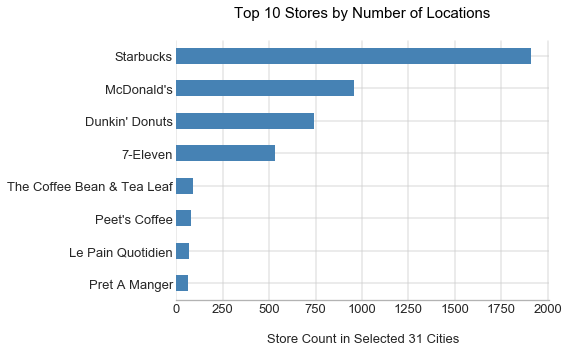

In [22]:
sns.set_style("whitegrid")

fig = plt.figure(figsize=(8,5))
ax  = fig.add_subplot()
temp = mega_data.groupby('Store_Name').count()["Count"].sort_values(ascending=False)[:8]
ax = temp[::-1].plot(kind='barh', color='steelblue', fontsize=13)
plt.xlabel('\nStore Count in Selected 31 Cities', size=13)
plt.ylabel('')
plt.grid(zorder=0)
for pos in ['top']:#, 'right', 'left']:
        ax.spines[pos].set_color("#ffffff")
        ax.spines[pos].set_linewidth(1.3)
        ax.spines[pos].set_alpha(0.5)
for pos in ['bottom']:#, 'right', 'left']:
        ax.spines[pos].set_color("dimgray")
        ax.spines[pos].set_linewidth(1.3)
        ax.spines[pos].set_alpha(0.5)
plt.setp([ax.get_xticklines(), ax.get_yticklines()], color='dimgray')
ax.tick_params(axis=1, color='dimgray', labelcolor='dimgray')

plt.title('Top 10 Stores by Number of Locations\n', size=15, color='black')
plt.tight_layout()
plt.savefig('plots/store_loc_count.png')

[]

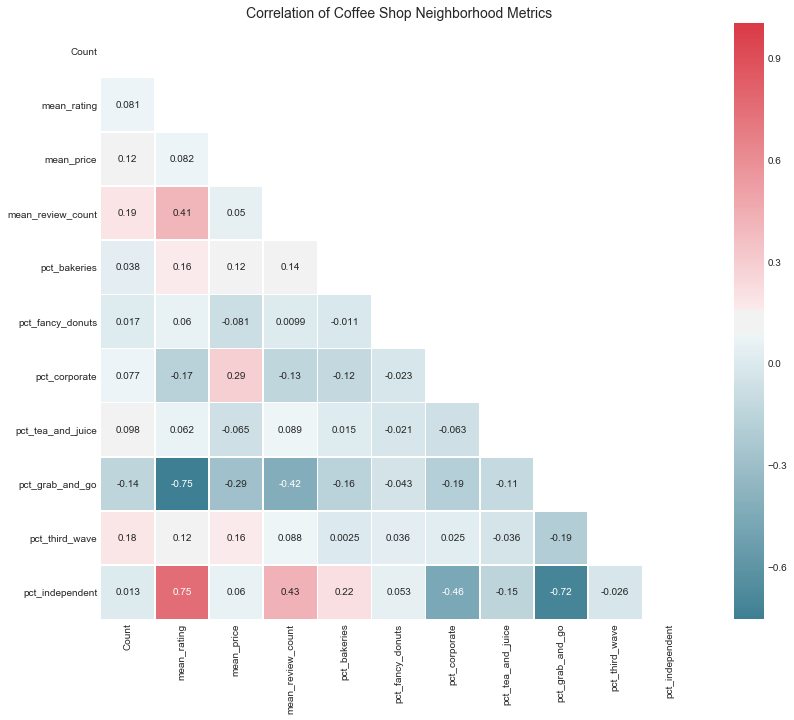

In [23]:
neigh_corr = data.corr()
fig = plt.figure(figsize=(12,10))
mask = np.zeros_like(neigh_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(neigh_corr, cmap=cmap, linewidths=0.5, annot=True, square=True, mask=mask)
plt.title('Correlation of Coffee Shop Neighborhood Metrics', size=14)
plt.tight_layout()
plt.savefig('plots/corr.png')
plt.plot()

### data pre-processing

In [25]:
print(len(data))
data_temp = data[data['Count'] >= 10]
print(len(data_temp))
X = samples = data_temp.iloc[:,5:].values
np.random.seed(42)
plt.style.use('ggplot')

scaler = preprocessing.MinMaxScaler()
minmax_scaled_df = scaler.fit_transform(X)
minmax_scaled_df = pd.DataFrame(minmax_scaled_df, 
                                columns=data_temp.columns[5:], 
                                index=data_temp.index)

minmax_scaled_df.head(2)

1173
308


/Users/alexshannon/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype object was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


,density,mean_rating,mean_price,mean_review_count,pct_bakeries,pct_fancy_donuts,pct_corporate,pct_tea_and_juice,pct_grab_and_go,pct_third_wave,pct_independent
full_name,,,,,,,,,,,
"Adams Morgan, Washington",0.081037,0.695804,0.541667,0.234003,0.000000,0.277778,0.208333,0.000000,0.101190,0.270833,0.666667
"Addicks Park Ten, Houston",0.000484,0.820871,0.333333,0.053399,0.384615,0.000000,0.384615,0.571429,0.093407,0.000000,0.307692


### hierarchical clustering

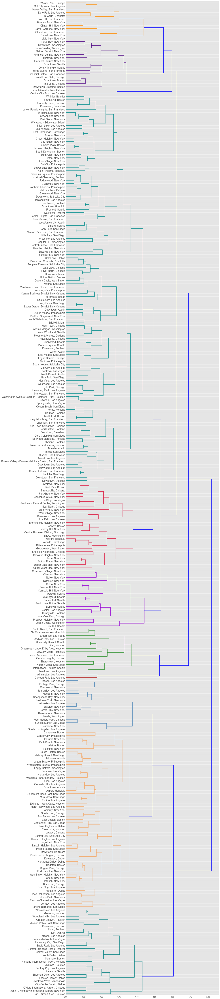

In [26]:
samples = minmax_scaled_df.values
labs = minmax_scaled_df.index
set_link_color_palette(['teal','sandybrown', 'steelblue', 'firebrick', 'forestgreen', 'darkviolet', 'crimson', 'darkcyan', 'peru', 'indigo', 'darkorange'])
plt.figure(figsize=(15, 100))
mergings = linkage(samples, method='complete')

dendo = dendrogram(mergings,
           labels=labs,
           leaf_rotation=0,
           leaf_font_size=14,
           color_threshold=1.2, # 1.2 gives 11 clusters
           orientation='right')


In [27]:
# create a dataframe with the colors listed in a column
a = pd.DataFrame(dendo['color_list'])
val_dict = dict(a.iloc[:,0].value_counts())
colors = a.iloc[:,0].unique()
color_list = []
for color in colors:
    if color != 'b':
        for i in range(val_dict[color] + 1):
            color_list.append(color)

neighb_colors = pd.DataFrame([color_list, dendo['ivl'], dendo['leaves']]).T
neighb_colors.rename({0:'color', 1:'City', 2:'leaf'}, axis=1,inplace=True)
neighb_colors = neighb_colors.set_index('City', drop=True)
len(neighb_colors['color'].unique())

11

### K-MEANS

/Users/alexshannon/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype object was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


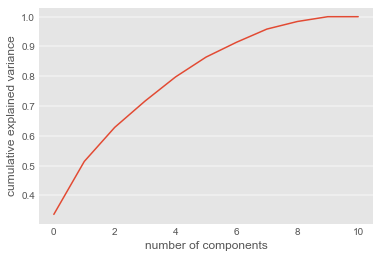

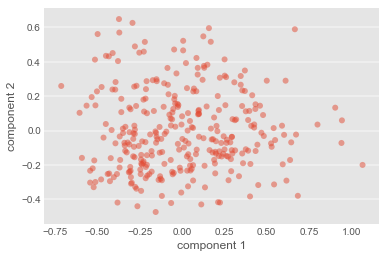

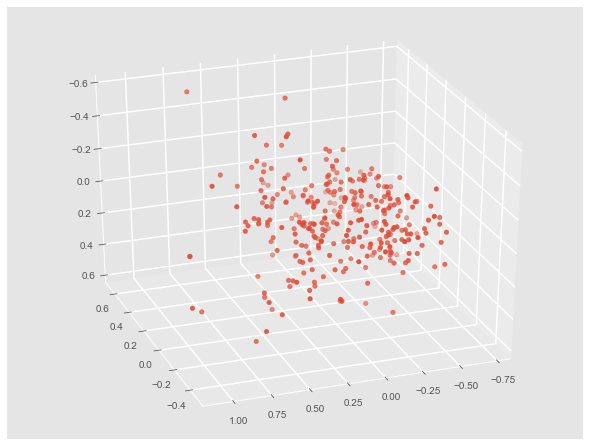

In [33]:
data_temp = data[data['Count'] >= 10]
X = samples = data_temp.iloc[:,5:].values
np.random.seed(42)
plt.style.use('ggplot')

scaler = preprocessing.MinMaxScaler()
minmax_scaled_df = scaler.fit_transform(X)
minmax_scaled_df = pd.DataFrame(minmax_scaled_df, 
                                columns=data_temp.columns[5:], 
                                index=data_temp.index)

pca = PCA().fit(minmax_scaled_df.values)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()

pca = PCA(5)
projected = pca.fit_transform(minmax_scaled_df.values)
plt.scatter(projected[:, 0], projected[:, 1], edgecolor='none', alpha=0.5)
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.show()

fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(projected[:, 0], projected[:, 1], projected[:, 2])
plt.show()

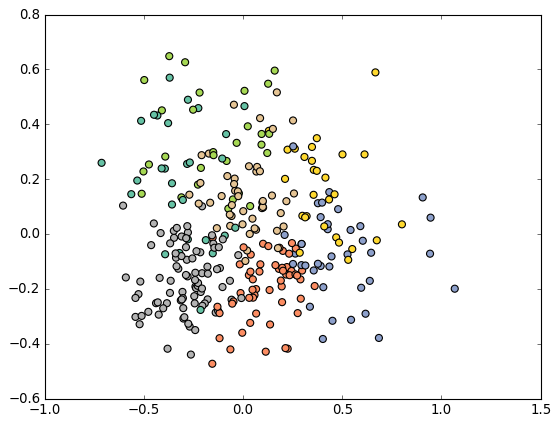

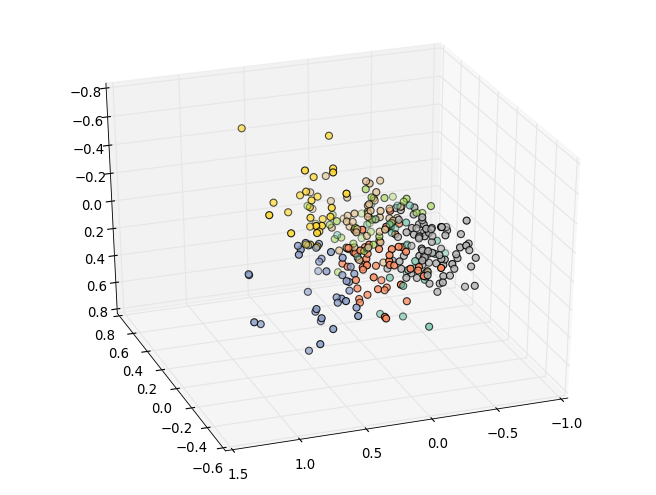

In [36]:
plt.style.use('classic')
plt.rcParams['figure.facecolor'] = '1'
n_clusters = 7
kmeans = KMeans(n_clusters, random_state=42)
labels = kmeans.fit(projected).predict(projected)
plt.scatter(projected[:, 0], projected[:, 1], c=labels, s=40, cmap='Set2');
plt.show()

fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(projected[:, 0], projected[:, 1], projected[:, 2], 
           c=labels, s=40, cmap='Set2')
plt.show()

In [39]:
data_temp['labels'] = labels
a = data_temp.sort_values('labels')
a = a.groupby(['labels', 'City', 'Name']).mean()

for i in range(n_clusters):
    temp = a.loc[i].reset_index()
    print(i, 'count:', len(temp))

for i in range(n_clusters):
    if i > 0:
        print('\n')
    print('****', i, '****')
    temp = a.loc[i].reset_index()
    print('count:', len(temp))
    city_temp = ''
    for j in range(len(temp)):
        if temp.loc[j].City != city_temp:
            city_temp = temp.iloc[j].City
            print('--------------')
            print(city_temp)
            print('--------------')
        print (temp.loc[j].Name)

/Users/alexshannon/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


0 count: 28
1 count: 56
2 count: 37
3 count: 31
4 count: 28
5 count: 45
6 count: 83
**** 0 ****
count: 28
--------------
Boston
--------------
South End
--------------
Cambridge
--------------
East Cambridge
Riverside
--------------
Honolulu
--------------
Waikiki
--------------
Los Angeles
--------------
Brentwood
Echo Park
Mid City West
Mid Wilshire
--------------
New York
--------------
Astoria
Boerum Hill
Carnegie Hill
Carroll Gardens
Chinatown
Clinton Hill
East Harlem
Hamilton Heights
Hunters Point
Little Italy
SoHo
Sunset Park
Sutton Place
Tribeca
Upper West Side
West Village
--------------
San Francisco
--------------
Chinatown
Lower Pacific Heights
--------------
Seattle
--------------
First Hill
Uptown


**** 1 ****
count: 56
--------------
Atlanta
--------------
Downtown
--------------
Austin
--------------
North Burnett
West University
--------------
Boston
--------------
Allston
Brighton
Chinatown
Jamaica Plain
South Dorchester
--------------
Chicago
--------------
Bucktown

In [40]:
#print out group info
minmax_scaled_df['labels'] = labels
a = minmax_scaled_df.groupby('labels').mean()
#a = data_temp.groupby('labels').mean()

a.iloc[:,:].T

labels,0,1,2,3,4,5,6
density,0.173097,0.037486,0.059183,0.243262,0.059075,0.082653,0.077079
mean_rating,0.732835,0.655324,0.445215,0.694094,0.486604,0.640939,0.811913
mean_price,0.592928,0.205782,0.270941,0.498585,0.379320,0.543174,0.327959
mean_review_count,0.141534,0.129862,0.052035,0.162333,0.067278,0.104883,0.192092
pct_bakeries,0.554288,0.199821,0.108233,0.232835,0.086209,0.217727,0.228506
pct_fancy_donuts,0.023650,0.085540,0.042066,0.084716,0.070622,0.055494,0.074459
pct_corporate,0.150490,0.242348,0.217701,0.233348,0.591386,0.375086,0.132054
pct_tea_and_juice,0.104679,0.232148,0.084600,0.064801,0.057127,0.060255,0.064708
pct_grab_and_go,0.153158,0.275356,0.616545,0.180815,0.288187,0.185644,0.109245
pct_third_wave,0.222306,0.017838,0.029748,0.504250,0.082559,0.074130,0.070397


In [41]:
k_means = minmax_scaled_df[['labels']]

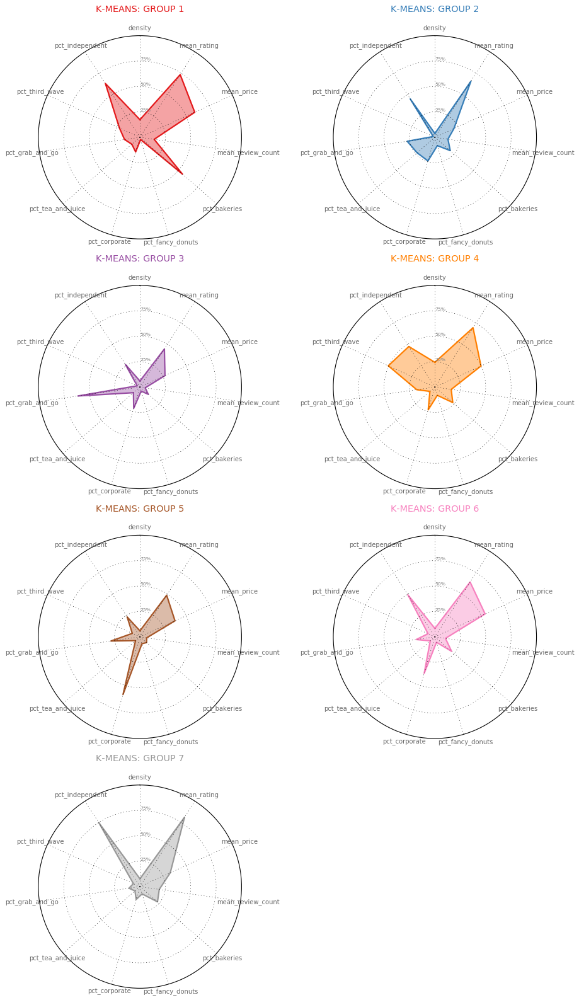

In [43]:
df = a.iloc[:,:].reset_index()
 
def make_spider( row, title, color):

    categories=list(df)[1:]
    N = len(categories)

    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    ax = plt.subplot(round(n_clusters/2), 2, row+1, polar=True)

    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    plt.xticks(angles[:-1], categories, color='dimgray', size=9)

    ax.set_rlabel_position(0)
    plt.yticks([0.25,0.5,0.75], ["25%","50%","75%"], color="grey", size=7)
    plt.ylim(0,1)

    values=df.loc[row].drop('labels').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    title = 'K-MEANS: GROUP ' + str(int(title)+1)
    plt.title(title, size=13, color=color, y=1.1)
    plt.tight_layout()

my_dpi=96
plt.figure(figsize=(12, 20))#, dpi=my_dpi)

my_palette = plt.cm.get_cmap("Set1", len(df.index))

for row in range(n_clusters):
    make_spider(row=row, title=df['labels'][row], color=my_palette(row))
plt.tight_layout()
plt.savefig('plots/km.png')


### GMMs

/Users/alexshannon/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype object was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


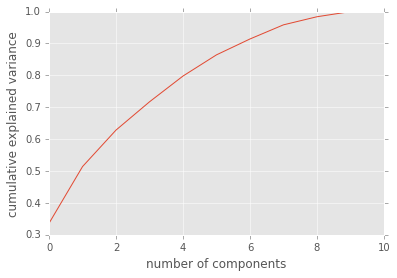

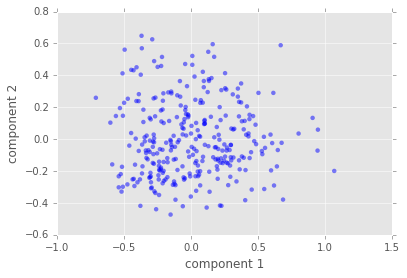

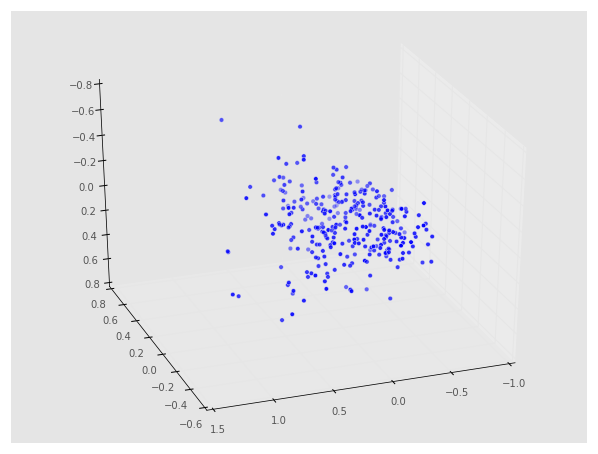

In [57]:
data_temp = data[data['Count'] >= 10]
X = samples = data_temp.iloc[:,5:].values
np.random.seed(42)
plt.style.use('ggplot')

scaler = preprocessing.MinMaxScaler()
minmax_scaled_df = scaler.fit_transform(X)
minmax_scaled_df = pd.DataFrame(minmax_scaled_df, 
                                columns=data_temp.columns[5:], 
                                index=data_temp.index)

pca = PCA().fit(minmax_scaled_df.values)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()

pca = PCA(5)
projected = pca.fit_transform(minmax_scaled_df.values)
plt.scatter(projected[:, 0], projected[:, 1], edgecolor='none', alpha=0.5)
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.show()

fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(projected[:, 0], projected[:, 1], projected[:, 2])
plt.show()

[]

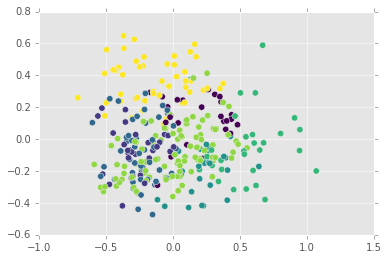

In [49]:
n_clusters = 7
gmm = GaussianMixture(n_components=n_clusters).fit(projected)
labels = gmm.predict(projected)
plt.scatter(projected[:, 0], projected[:, 1], c=labels, s=40, cmap='viridis')
plt.savefig('plots/gmm_2d.png');
plt.plot()

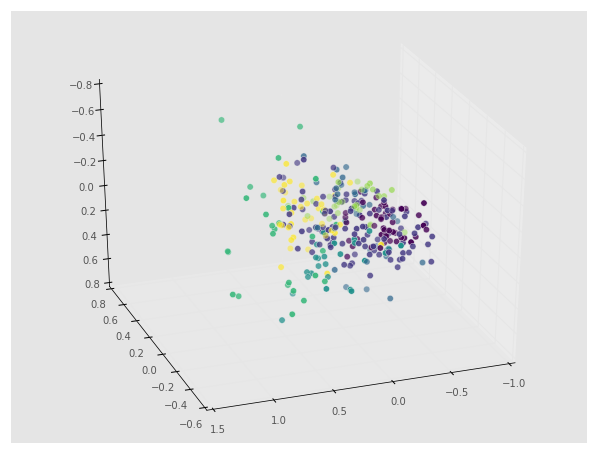

In [48]:
fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(projected[:, 0], projected[:, 1], projected[:, 2], 
           c=labels, s=40, cmap='viridis')
plt.savefig('plots/gmm_3d.png')

In [50]:
data_temp['labels'] = labels
a = data_temp.sort_values('labels')
a = a.groupby(['labels', 'City', 'Name']).mean()

for i in range(n_clusters):
    temp = a.loc[i].reset_index()
    print(i, 'count:', len(temp))

for i in range(n_clusters):
    if i > 0:
        print('\n')
    print('****', i, '****')
    temp = a.loc[i].reset_index()
    print('count:', len(temp))
    city_temp = ''
    for j in range(len(temp)):
        if temp.loc[j].City != city_temp:
            city_temp = temp.iloc[j].City
            print('--------------')
            print(city_temp)
            print('--------------')
        print (temp.loc[j].Name)

/Users/alexshannon/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


0 count: 29
1 count: 29
2 count: 49
3 count: 27
4 count: 29
5 count: 97
6 count: 48
**** 0 ****
count: 29
--------------
Boston
--------------
Allston
Chinatown
Downtown
Downtown Crossing
Fenway
Kenmore
--------------
Chicago
--------------
Near North
South Loop
Streeterville
The Loop
West Loop Gate
--------------
Dallas
--------------
City Center District
North Dallas
--------------
Denver
--------------
Central Business District
--------------
Honolulu
--------------
Ala Moana-Kakaako
McCully-Moiliili
--------------
Las Vegas
--------------
Enterprise
--------------
Los Angeles
--------------
North Hollywood
--------------
New York
--------------
Downtown
Gramercy
--------------
Philadelphia
--------------
Center City
--------------
San Diego
--------------
Carmel Valley
--------------
San Francisco
--------------
Financial District
South Beach
Yerba Buena
--------------
Seattle
--------------
Denny Triangle
--------------
Washington
--------------
Georgetown
NoMa
Shaw


**** 1 ****


In [51]:
minmax_scaled_df['labels'] = labels
a = minmax_scaled_df.groupby('labels').mean()
#a = data_temp.groupby('labels').mean()

a.iloc[:,:].T

labels,0,1,2,3,4,5,6
density,0.188707,0.103796,0.092810,0.024212,0.013541,0.039003,0.220582
mean_rating,0.625409,0.755533,0.797551,0.603296,0.400670,0.676941,0.674259
mean_price,0.378523,0.417046,0.349551,0.209396,0.274518,0.352116,0.581699
mean_review_count,0.107661,0.162196,0.204463,0.126993,0.046458,0.116434,0.142194
pct_bakeries,0.132160,0.387548,0.190258,0.239701,0.006785,0.222811,0.342388
pct_fancy_donuts,0.079619,0.045571,0.086635,0.086895,0.025223,0.069384,0.054298
pct_corporate,0.372707,0.064440,0.199515,0.199100,0.377237,0.273460,0.253693
pct_tea_and_juice,0.155990,0.076064,0.104469,0.352065,0.074927,0.045639,0.058289
pct_grab_and_go,0.260145,0.193475,0.087163,0.368526,0.510774,0.230705,0.188529
pct_third_wave,0.189696,0.090872,0.135433,0.000000,0.000000,0.000000,0.430700


In [52]:
gmm = minmax_scaled_df[['labels']]

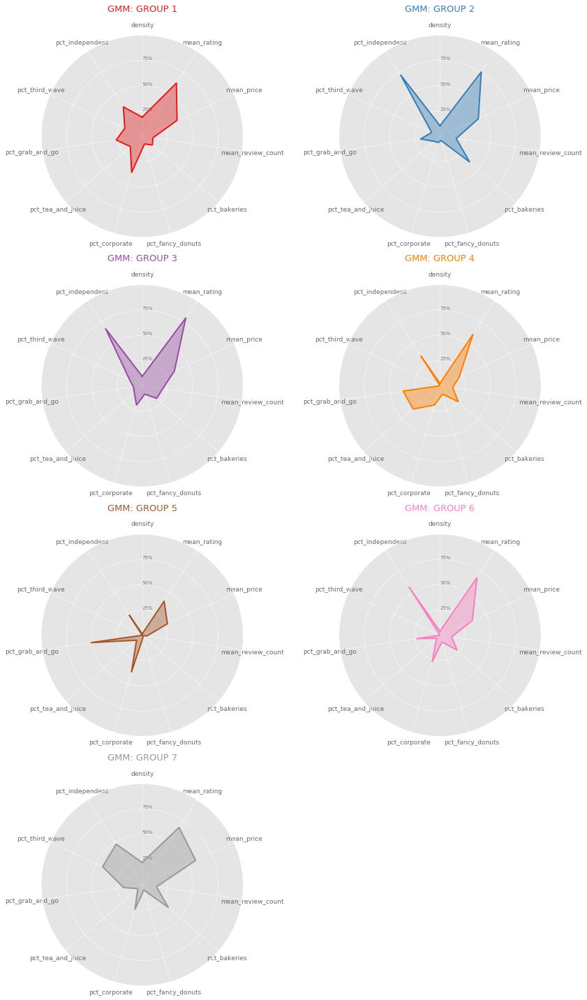

In [53]:
df = a.iloc[:,:].reset_index()
 
def make_spider( row, title, color):

    categories=list(df)[1:]
    N = len(categories)

    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    ax = plt.subplot(round(n_clusters/2), 2, row+1, polar=True)

    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    plt.xticks(angles[:-1], categories, color='dimgray', size=9)

    ax.set_rlabel_position(0)
    plt.yticks([0.25,0.5,0.75], ["25%","50%","75%"], color="grey", size=7)
    plt.ylim(0,1)

    values=df.loc[row].drop('labels').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    title = 'GMM: GROUP ' + str(int(title)+1)
    plt.title(title, size=13, color=color, y=1.1)
    plt.tight_layout()

my_dpi=96
plt.figure(figsize=(12, 20))#, dpi=my_dpi)

my_palette = plt.cm.get_cmap("Set1", len(df.index))

for row in range(n_clusters):
    make_spider(row=row, title=df['labels'][row], color=my_palette(row))
plt.tight_layout()
plt.savefig('plots/gmm.png')

## Power laws!

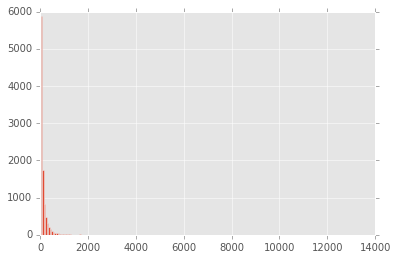

In [55]:
mega_data[mega_data['Review_Count']>10].Review_Count.hist(bins=200)

## scratch work

* create columns for types of chains (Corporate, Grab & Go, 3rd Wave)


In [59]:
def store_count(store_name=''):
    store_count = mega_data.groupby(['City', 'Store_Name']).sum().sort_values(['City','Count'], ascending=[True,False])
    if store_name != '':
        store_count = store_count.filter(like=store_name,axis=0)
    store_count = store_count.reset_index(level=1, drop=True)
    store_count = store_count.groupby(store_count.index).sum()['Count']
    return store_count



/Users/alexshannon/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


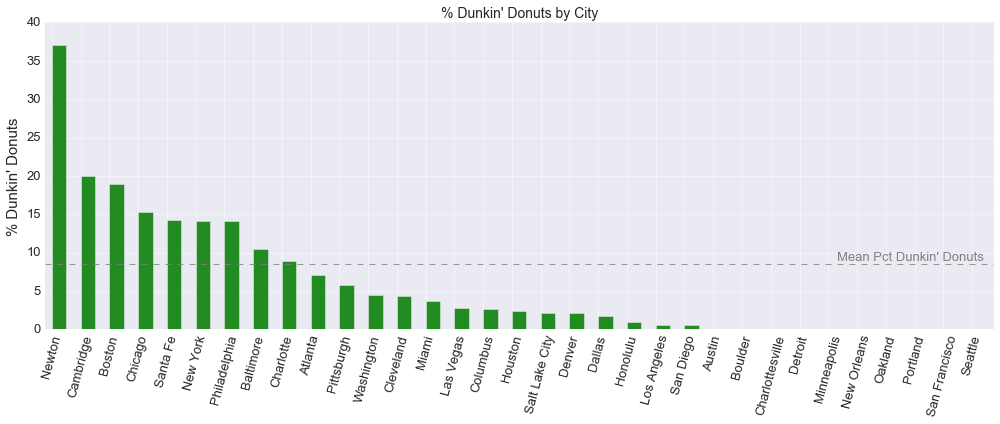

In [71]:
store_name = 'Dunkin\' Donuts' # insert any coffee shop name in here

color = 'gray'
pct_starbucks = (store_count(store_name) / store_count()) * 100
pct_starbucks = pct_starbucks.sort_values(ascending=False)
plt.figure(figsize=(14,6))
ax = fig.add_subplot(111)
sns.set_style("darkgrid")
pct_starbucks.plot.bar(color='forestgreen', fontsize=13, rot=75, position=0.0)
plt.axhline(pct_starbucks.mean(), color=color, alpha=0.8,linestyle='--')
plt.text(27.3,pct_starbucks.mean()+0.5,'Mean Pct {}'.format(store_name), size=13, color=color)
plt.ylabel('% {}'.format(store_name), fontsize=15)
plt.xlabel('', fontsize=12)
plt.title('% {} by City'.format(store_name), size=14)
plt.tight_layout()
plt.savefig('plots/pct_starbucks.png')
plt.show()

In [80]:
city = 'Denver'
mega_map[(mega_map.City == city) & ((mega_map.Name =='Five Points') | (mega_map.Name =="Central Business District"))]

,State,County,City,Name,RegionID,geometry,coords,count,mean_rating,mean_price,...,pct_strictly_coffee,pct_coffee_is_cat,pct_breakfast_and_brunch,pct_bakeries,pct_diner,pct_deli,pct_ice_cream_and_froyo,pct_juice_and_smoothie,full_name,neighborhood_area
974,CO,Denver,Denver,Central Business District,268632,POLYGON ((-104.9874700837624 39.74750922742454...,"(-104.99350443758058, 39.746285216604385)",30,3.183,1.333,...,0.60,1.0,0.067,0.00,0.0,0.0,0.0,0.0,"Central Business District, Denver",1.173790
978,CO,Denver,Denver,Five Points,268662,POLYGON ((-104.9719499999999 39.77024000000006...,"(-104.98733548871061, 39.759432134000065)",12,4.292,1.333,...,0.25,1.0,0.417,0.25,0.0,0.0,0.0,0.0,"Five Points, Denver",4.802355


In [81]:
nyc_data = mega_data[mega_data.City=='New York']
nyc_category_pct = nyc_data.groupby(['County', 'category']).sum()[['Count']]
nyc_category_pct = nyc_category_pct.pivot_table(values='Count', index='County', columns='category',aggfunc='sum')
nyc_category_pct['total'] = nyc_data['County'].value_counts()
nyc_category_pct = nyc_category_pct.fillna(0)
for col in nyc_category_pct.columns[:-1]:
    nyc_category_pct[col] = nyc_category_pct[col] / nyc_category_pct['total']
nyc_category_pct.drop('total', axis=1, inplace=True)
nyc_category_pct = nyc_category_pct.reset_index()
nyc_category_pct['County'] = nyc_category_pct['County'].map({'Kings':'Brooklyn', 'New York':'Manhattan', 
                                                             'Richmond':'Staten Island','Queens':'Queens','Bronx':'Bronx'})
nyc_category_pct

category,County,corporate,grab_and_go,independent,tea_and_juice,third_wave
0,Bronx,0.107843,0.588235,0.303922,0.000000,0.000000
1,Brooklyn,0.062500,0.251603,0.621795,0.030449,0.033654
2,Manhattan,0.190476,0.230415,0.438556,0.041475,0.099078
3,Queens,0.100616,0.404517,0.416838,0.071869,0.006160
4,Staten Island,0.131148,0.475410,0.377049,0.016393,0.000000


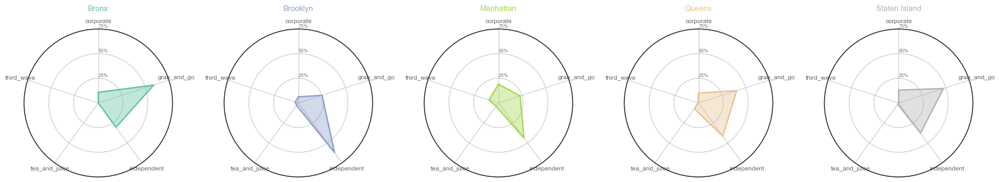

In [82]:
df = nyc_category_pct#city_category_pct.reset_index()[:4]
# ------- PART 1: Define a function that do a plot for one line of the dataset!
 
def make_spider( row, title, color):

    # number of variable
    categories=list(df)[1:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    # Initialise the spider plot
    ax = plt.subplot(1, 5, row+1, polar=True)

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='dimgray', size=9)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([0.25,0.5,0.75], ["25%","50%","75%"], color="grey", size=7)
    plt.ylim(0,0.75)

    # Ind1
    values=df.loc[row].drop('County').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    plt.tight_layout()
    plt.title(title, size=11, color=color, y=1.1)

# ------- PART 2: Apply to all individuals
# initialize the figure
my_dpi=96
plt.figure(figsize=(20, 8), dpi=my_dpi)

# Create a color palette:
my_palette = plt.cm.get_cmap("Set2", len(df.index))

#Loop to plot
for row in range(0, len(range(5))):
    make_spider(row=row, title=df['County'][row], color=my_palette(row))
plt.savefig('plots/nyc_boro_comp.png')

In [83]:
city_category_pct = mega_data.groupby(['City', 'category']).sum()[['Count']]
city_category_pct = city_category_pct.pivot_table(values='Count', index='City', columns='category',aggfunc='sum')
city_category_pct['total'] = mega_data['City'].value_counts()
city_category_pct = city_category_pct.fillna(0)
for col in city_category_pct.columns[:-1]:
    city_category_pct[col] = city_category_pct[col] / city_category_pct['total']
city_category_pct.drop('total', axis=1, inplace=True)
city_category_pct

temp = city_category_pct.reset_index()
temp['temp2'] = [2 if city in ['San Francisco', 'Portland', 'Pittsburgh'] else 1 for city in temp.City]
temp=temp.sort_values('temp2', ascending=False).reset_index(drop=True)
temp.drop('temp2', axis=1, inplace=True)
#temp

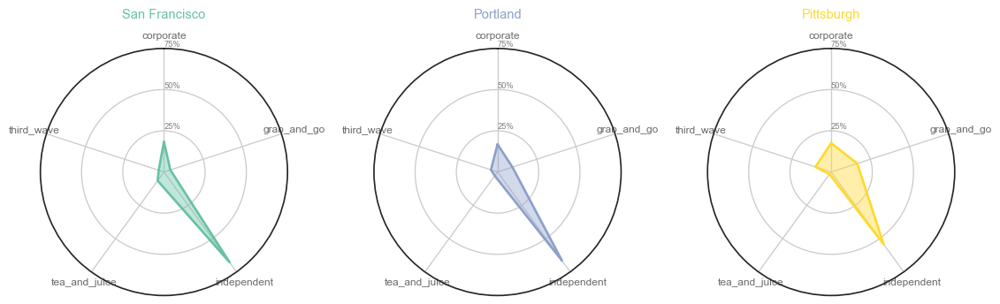

In [84]:
from math import pi
 
df = temp[:4]#city_category_pct.reset_index()[:4]
# ------- PART 1: Define a function that do a plot for one line of the dataset!
 
def make_spider( row, title, color):

    # number of variable
    categories=list(df)[1:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    # Initialise the spider plot
    ax = plt.subplot(1, 3, row+1, polar=True)

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='dimgray', size=9)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([0.25,0.5,0.75], ["25%","50%","75%"], color="grey", size=7)
    plt.ylim(0,0.75)

    # Ind1
    values=df.loc[row].drop('City').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    plt.tight_layout()
    plt.title(title, size=11, color=color, y=1.1)

# ------- PART 2: Apply to all individuals
# initialize the figure
my_dpi=96
plt.figure(figsize=(12, 10), dpi=my_dpi)

# Create a color palette:
my_palette = plt.cm.get_cmap("Set2", len(df.index))

#Loop to plot
for row in range(0, len(range(3))):
    make_spider(row=row, title=df['City'][row], color=my_palette(row))
plt.savefig('plots/other_cities_comp.png')
# for row in range(0, len(df.index)):
#     make_spider(row=row, title=df['City'][row], color=my_palette(row))

In [85]:
my_dpi=96
plt.figure(figsize=(1000/my_dpi, 1000/my_dpi), dpi=my_dpi)

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

In [86]:
for col in city_category_pct.columns:
    print(col)
    print('top 5')
    print(city_category_pct.sort_values(col, ascending=False)[col].head())
    print('bottom 5')
    print(city_category_pct.sort_values(col, ascending=True)[col].head())
    print('-----------------------------')

corporate
top 5
City
Las Vegas      0.348315
Newton         0.296296
Houston        0.283619
Minneapolis    0.277778
Dallas         0.273504
Name: corporate, dtype: float64
bottom 5
City
Charlottesville    0.083333
Salt Lake City     0.117021
Detroit            0.130435
Cleveland          0.132353
New York           0.137811
Name: corporate, dtype: float64
-----------------------------
grab_and_go
top 5
City
Newton       0.444444
Columbus     0.385621
Chicago      0.357562
Boston       0.325333
Charlotte    0.289655
Name: grab_and_go, dtype: float64
bottom 5
City
Boulder            0.000000
San Francisco      0.040639
Minneapolis        0.069444
Charlottesville    0.083333
Seattle            0.086538
Name: grab_and_go, dtype: float64
-----------------------------
independent
top 5
City
Boulder            0.794118
Charlottesville    0.791667
New Orleans        0.695035
Cleveland          0.691176
San Francisco      0.677794
Name: independent, dtype: float64
bottom 5
City
Newton       0.

#### Bordering Neighborhoods

/Users/alexshannon/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/alexshannon/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


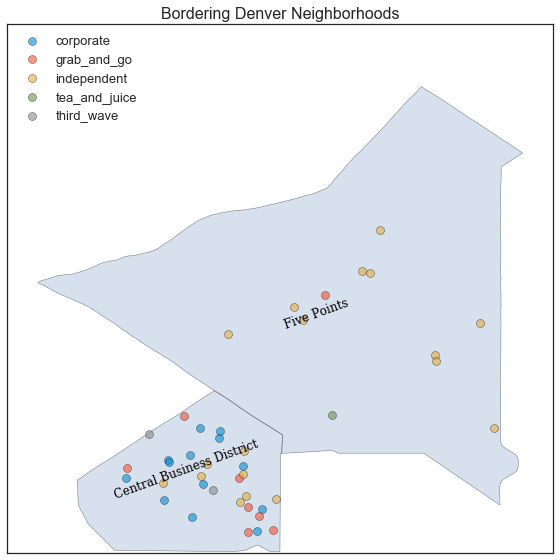

In [88]:
def categorize(item):
    if item.corporate:
        return 'corporate'
    if item.tea_and_juice:
        return 'tea_and_juice'
    if item.grab_and_go:
        return 'grab_and_go'
    if item.third_wave:
        return 'third_wave'
    else:
        return 'independent'

mega_data['category'] = [categorize(mega_data.iloc[i]) for i in range(len(mega_data))] 
mega_data.head()

city_map  = mega_map[(mega_map.City == city) & ((mega_map.Name =='Five Points') | (mega_map.Name =="Central Business District"))]
city_data = mega_data[(mega_data.City == city) & ((mega_data.Name =='Five Points') | (mega_data.Name =="Central Business District"))]

a = city_data.Location.apply(lambda x: x.split(', '))
x = a.apply(lambda x: float(x[0][1:]))
y = a.apply(lambda x: float(x[1][:-1]))
city_data['x'] = x
city_data['y'] = y

def plot_map(map_gdf, data_gdf, column='count', neighborhood_labels=True):
    sns.set_style("white")
    vmin, vmax = map_gdf[column].min(), map_gdf[column].max()
    fig, ax = plt.subplots(1, figsize=(8,8))
    base = map_gdf.plot(ax=ax, edgecolor='black', vmin=vmin, vmax=vmax, legend=True, color='lightsteelblue', alpha=0.5)
    
    data_gdf.set_index('y').sort_index().groupby('category')['x'].plot(style='o', legend=True, markersize=8, alpha=0.6,)

    #data_gdf.plot(ax=base, marker="o", label=data_gdf.category, cmap='viridis', markersize=14, alpha=0.7)
    # add neighborhood labels
    if neighborhood_labels == True:
        for idx, row in map_gdf.iterrows():
            if row['Name'] == 'Five Points':
                vert, hor, rot = 'top', 'left', '20'
            else:
                vert, hor, rot = 'center', 'center', '20'
            plt.annotate(s=row['Name'], xy=row['coords'], color='k', ha=hor, 
                         va=vert , family='serif', size=12, rotation=rot)
    ax.set_title("Bordering Denver Neighborhoods", size=16)
    ax.legend(loc=2, fontsize=13)
    plt.xlabel('')
    plt.yticks([])
    plt.xticks([])
    plt.tight_layout()
    plt.savefig('plots/denver_neighborhood_comp.png')
    
    plt.show()
    
plot_map(city_map, city_data, 'count')

/Users/alexshannon/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/alexshannon/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


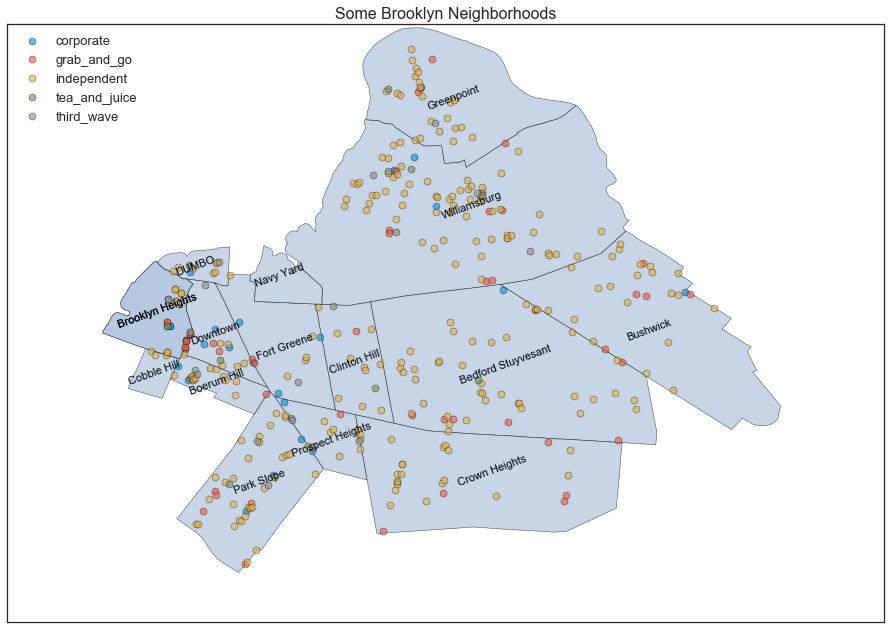

In [89]:
plt.style.use('fivethirtyeight')
n1 = 'Clinton Hill'
n2 = 'Bedford Stuyvesant'
n3 = 'Fort Greene'
n4 = 'Downtown'
n5 = 'Bushwick'
n6 = 'Williamsburg'
n7 = 'Greenpoint'
n8 = 'DUMBO'
n9 = 'Crown Heights'
n10 = 'Boerum Hill'
n11 = 'Navy Yard'
n12 = 'Brooklyn Heights'
n13 = 'Park Slope'
n14 = 'Prospect Heights'
n15 = 'Cobble Hill'
n16 = 'Downtown'

city_map  = mega_map[(mega_map.City == 'New York') & ((mega_map.Name==n1) | (mega_map.Name==n2)\
                                                     | (mega_map.Name==n3) | (mega_map.Name==n4)\
                                                     | (mega_map.Name==n5) | (mega_map.Name==n6)\
                                                     | (mega_map.Name==n7) | (mega_map.Name==n8)\
                                                     | (mega_map.Name==n9) | (mega_map.Name==n10)\
                                                     | (mega_map.Name==n11) | (mega_map.Name==n12)\
                                                     | (mega_map.Name==n13) | (mega_map.Name==n14)\
                                                     | (mega_map.Name==n15) | (mega_map.Name==n16))]
city_data = mega_data[(mega_data.City == 'New York') & ((mega_data.Name==n1) | (mega_data.Name ==n2)\
                                                       | (mega_data.Name==n3) | (mega_data.Name ==n4)\
                                                       | (mega_data.Name==n5) | (mega_data.Name ==n6)\
                                                       | (mega_data.Name==n7) | (mega_data.Name ==n8)\
                                                       | (mega_data.Name==n9) | (mega_data.Name ==n10)\
                                                       | (mega_data.Name==n11) | (mega_data.Name ==n12)\
                                                       | (mega_data.Name==n13) | (mega_data.Name ==n14)\
                                                       | (mega_data.Name==n15) | (mega_data.Name ==n16))]

a = city_data.Location.apply(lambda x: x.split(', '))
x = a.apply(lambda x: float(x[0][1:]))
y = a.apply(lambda x: float(x[1][:-1]))
city_data['x'] = x
city_data['y'] = y

def plot_map(map_gdf, data_gdf, column='count', neighborhood_labels=True):
    sns.set_style("white")
    vmin, vmax = map_gdf[column].min(), map_gdf[column].max()
    fig, ax = plt.subplots(1, figsize=(14,10))
    base = map_gdf.plot(ax=ax, edgecolor='black', vmin=vmin, vmax=vmax, legend=True, color='lightsteelblue', alpha=0.7)
    
    data_gdf.set_index('y').sort_index().groupby('category')['x'].plot(style='o', legend=True, markersize=7, alpha=0.6,)

    #data_gdf.plot(ax=base, marker="o", label=data_gdf.category, cmap='viridis', markersize=14, alpha=0.7)
    # add neighborhood labels
    if neighborhood_labels == True:
        for idx, row in map_gdf.iterrows():
            if row['Name'] == 'Five Points':
                vert, hor, rot = 'top', 'left', '20'
            else:
                vert, hor, rot = 'center', 'center', '20'
            plt.annotate(s=row['Name'], xy=row['coords'], color='k', ha=hor, 
                         va=vert , family='sans-serif', size=11, rotation=rot)
    ax.set_title("Some Brooklyn Neighborhoods", size=16)
    ax.legend(loc=2, fontsize=13)
    plt.ylabel('')
    plt.xlabel('')
    plt.xticks([])
    plt.yticks([])
    plt.savefig('plots/brooklyn_neighborhood_comp.png')
    plt.show()
        
plot_map(city_map, city_data, 'count')

### Comparing different clustering methods

In [92]:
neighb_colors = neighb_colors[['color']]
neighb_colors = neighb_colors.sort_index()

In [93]:
test1 = k_means#.head(50)
test2 = gmm#.head(50)
test3 = neighb_colors#.head(50)

a = [[int(i == j) for i in test1.labels] for j in test1.labels]
b = [[int(i == j) for i in test2.labels] for j in test2.labels]
c = [list(map(lambda a,b: a+b, a[i], b[i])) for i in range(len(a))]
d = [[int(i == j) for i in test3.color] for j in test3.color]
f = [list(map(lambda a,b: a+b, c[i], d[i])) for i in range(len(d))]

temp = pd.DataFrame(data=f, index=test1.index, columns=test1.index) 

# fig = plt.figure(figsize=(150,150))
# mask = np.zeros_like(temp, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True
# #cmap = sns.diverging_palette(220, 10, as_cmap=True)
# sns.heatmap(temp, cmap='Blues', linewidths=0.5, square=True, mask=mask, cbar=False)
# #plt.title('Correlation of Coffee Shop Neighborhood Metrics', size=14)
# plt.ylabel('')
# plt.xlabel('')
# plt.tight_layout()
# plt.savefig('plots/tots_large.png')
# plt.plot()

In [94]:
temp = pd.DataFrame(data=f, index=test1.index, columns=test1.index) 

fig = plt.figure(figsize=(150,150))
mask = np.zeros_like(temp, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(temp, cmap=cmap, linewidths=0.5, square=True, mask=mask, cbar=False)
#plt.title('Correlation of Coffee Shop Neighborhood Metrics', size=14)
plt.ylabel('')
plt.xlabel('')
plt.tight_layout()
plt.savefig('plots/tots_large.png')
plt.plot()

[]

In [95]:
k_means.index[:30:4]

Index(['Adams Morgan, Washington', 'Alief, Houston', 'Ballard, Seattle',
       'Bay Ridge, New York', 'Bensonhurst, New York',
       'Brentwood, Los Angeles', 'Buckman, Portland', 'Capitol Hill, Seattle'],
      dtype='object', name='full_name')

/Users/alexshannon/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


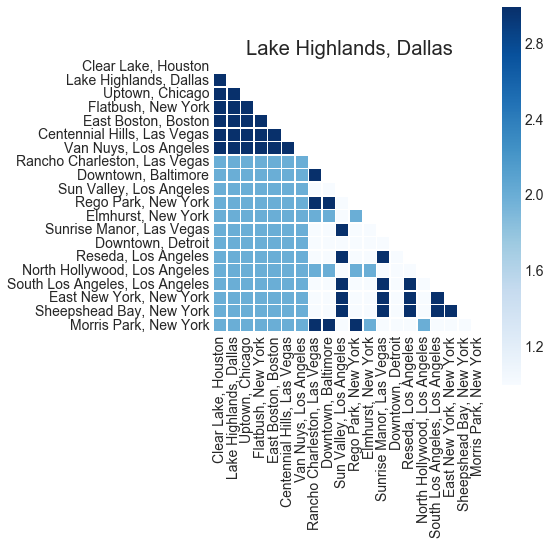

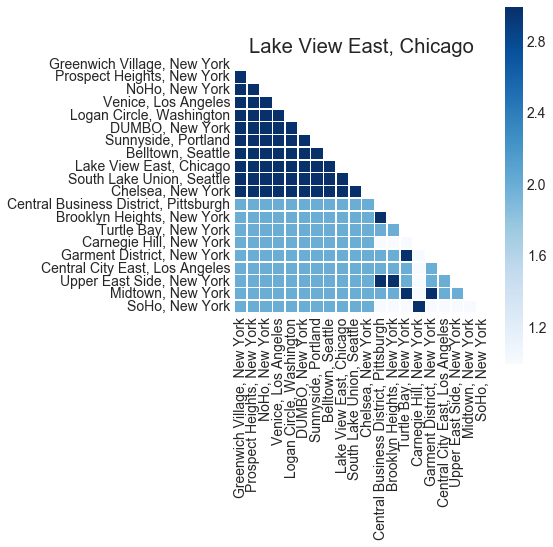

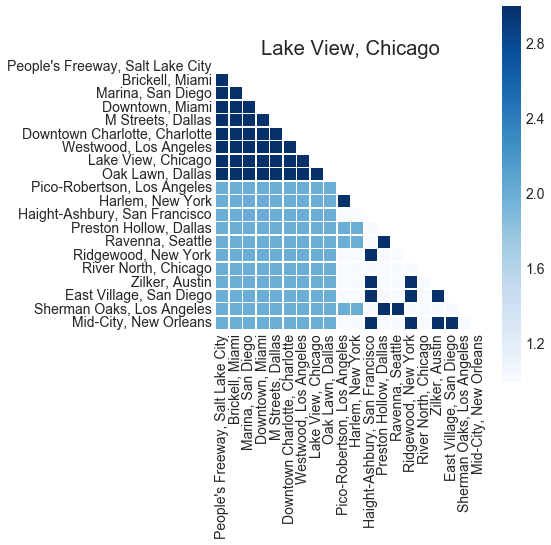

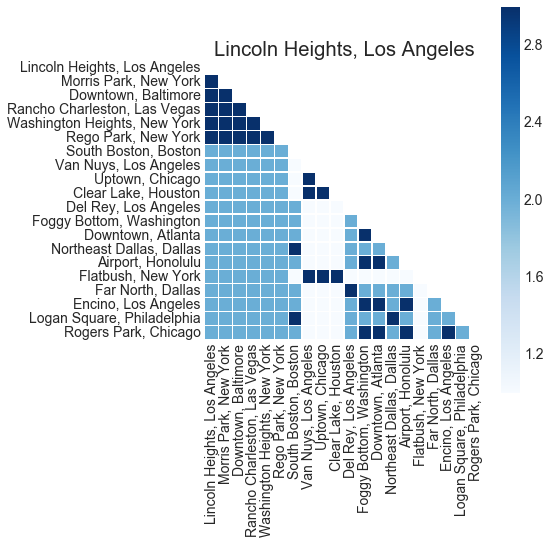

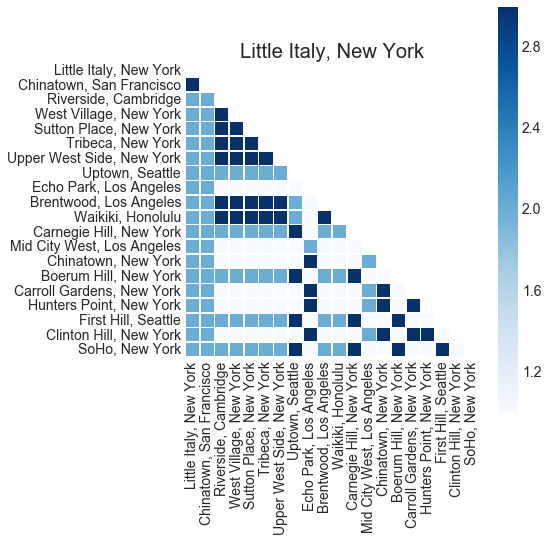

...

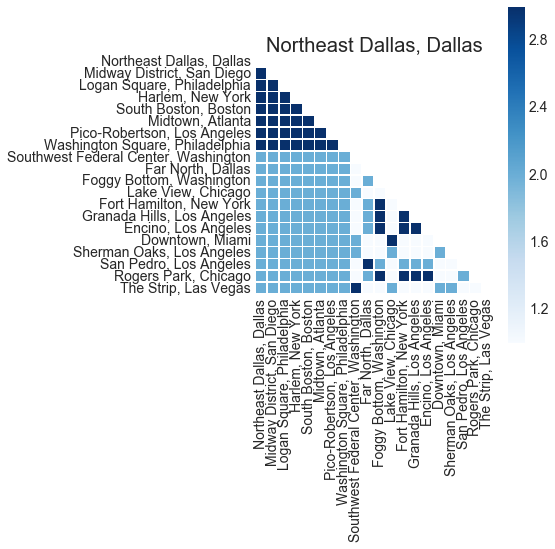

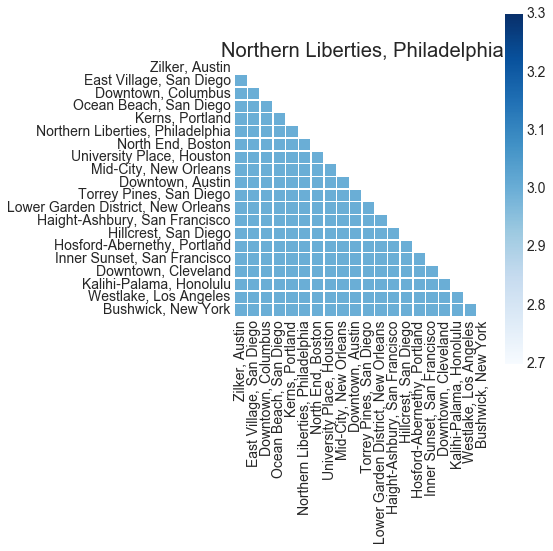

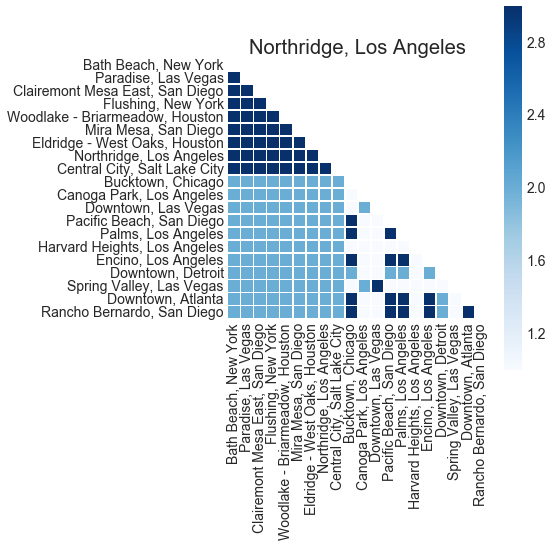

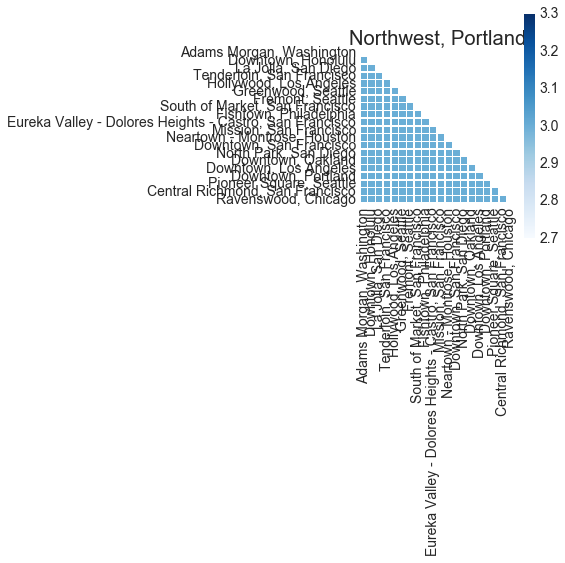

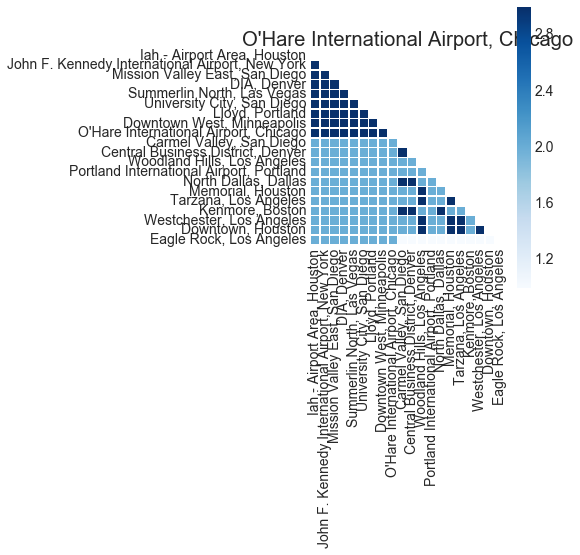

In [96]:
for neighb in k_means.index[150:200]:
    test1 = k_means#.head(50)
    test2 = gmm#.head(50)
    test3 = neighb_colors#.head(50)
    
    a = [[int(i == j) for i in test1.labels] for j in test1.labels]
    b = [[int(i == j) for i in test2.labels] for j in test2.labels]
    c = [list(map(lambda a,b: a+b, a[i], b[i])) for i in range(len(a))]
    d = [[int(i == j) for i in test3.color] for j in test3.color]
    f = [list(map(lambda a,b: a+b, c[i], d[i])) for i in range(len(d))]

    temp = pd.DataFrame(data=f, index=test1.index, columns=test1.index) 

    hood = neighb
    hi = temp[hood].sort_values(ascending=False).head(20).index

    test1 = k_means.loc[hi]#.head(50)
    test2 = gmm.loc[hi]#.head(50)
    test3 = neighb_colors.loc[hi]#.head(50)

    a = [[int(i == j) for i in test1.labels] for j in test1.labels]
    b = [[int(i == j) for i in test2.labels] for j in test2.labels]
    c = [list(map(lambda a,b: a+b, a[i], b[i])) for i in range(len(a))]
    d = [[int(i == j) for i in test3.color] for j in test3.color]
    f = [list(map(lambda a,b: a+b, c[i], d[i])) for i in range(len(d))]

    temp = pd.DataFrame(data=f, index=test1.index, columns=test1.index) 

    fig = plt.figure(figsize=(8,8))
    mask = np.zeros_like(temp, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    #cmap = sns.diverging_palette(220, 10, as_cmap=True)
    sns.heatmap(temp, cmap='Blues', linewidths=0.5, square=True, mask=mask, cbar=True)
    #plt.title('Correlation of Coffee Shop Neighborhood Metrics', size=14)
    plt.ylabel('')
    plt.xlabel('')
    plt.title(neighb)
    plt.tight_layout()
    #plt.savefig('plots/tots_wburg.png')
    plt.plot()

[]

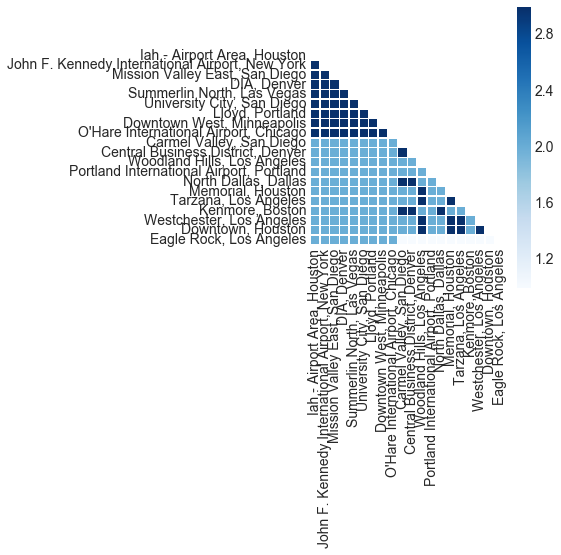

In [97]:
test1 = k_means.loc[hi]#.head(50)
test2 = gmm.loc[hi]#.head(50)
test3 = neighb_colors.loc[hi]#.head(50)

a = [[int(i == j) for i in test1.labels] for j in test1.labels]
b = [[int(i == j) for i in test2.labels] for j in test2.labels]
c = [list(map(lambda a,b: a+b, a[i], b[i])) for i in range(len(a))]
d = [[int(i == j) for i in test3.color] for j in test3.color]
f = [list(map(lambda a,b: a+b, c[i], d[i])) for i in range(len(d))]

temp = pd.DataFrame(data=f, index=test1.index, columns=test1.index) 

fig = plt.figure(figsize=(8,8))
mask = np.zeros_like(temp, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
#cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(temp, cmap='Blues', linewidths=0.5, square=True, mask=mask, cbar=True)
#plt.title('Correlation of Coffee Shop Neighborhood Metrics', size=14)
plt.ylabel('')
plt.xlabel('')
plt.tight_layout()
#plt.savefig('plots/tots_wburg.png')
plt.plot()